In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
from numpy import pi
import matplotlib.pyplot as plt
import pandas as pd
import swifter
from utils.prepro import single_preprocess,RunIdentifier
from utils.constants import get_page_num
from cycler import cycler
CANNEAL_50_NO_ASLR_PATH = "/home/garvalov/mlp2/data/data/no_aslr_parsec_raw_out/canneal/200_50/fltrace-data-faults-53997-1.out"
PROCMAP = "/home/garvalov/mlp2/data/data/no_aslr_parsec_raw_out/canneal/200_50/fltrace-data-procmaps-53997.out"
runid = RunIdentifier("canneal",200,50,53397)
from copy import deepcopy

In [3]:
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.stattools import acf
from scipy.signal import find_peaks

In [4]:
canneal_base_df = pd.read_csv(CANNEAL_50_NO_ASLR_PATH) 

In [5]:
cfull,_ = single_preprocess(runid,canneal_base_df,PROCMAP)

Translating iphex to int:   0%|          | 0/11120860 [00:00<?, ?it/s]

Splitting and translating st:   0%|          | 0/11120860 [00:00<?, ?it/s]

Inspect! canneal_200_50_53397: # of weird ips is 307
Splitting stacktraces (can take several minutes)


Finding all ip librairies..: 100%|██████████| 597/597 [00:00<00:00, 244340.31it/s]


Removing all ips before fltrace:   0%|          | 0/11040894 [00:00<?, ?it/s]

Translating addrhex to int:   0%|          | 0/11040894 [00:00<?, ?it/s]

In [6]:
canneal_preprocessed = cfull.iloc[5_000_000:5_200_000]

In [7]:
canneal_preprocessed.head()

,tstamp,ip,addr,flags,regs,stacktrace
5078316,1.729475e+09,93824992279596,140736714522624,0,140737488346768!140737289734096!0!140735579948...,"(93824992279596, 93824992242507, 9382499224201..."
5078317,1.729475e+09,93824992242776,140736624640000,1,140737488346768!140737289734096!0!140735579948...,"(93824992242776, 93824992243712, 9382499227961..."
5078318,1.729475e+09,93824992279349,140736701083648,0,140737488346768!140737289734096!0!140735579948...,"(93824992279349, 93824992242507, 9382499224201..."
5078319,1.729475e+09,93824992279596,140736682905600,0,140737488346768!140737289734096!0!140735579948...,"(93824992279596, 93824992242507, 9382499224201..."
5078320,1.729475e+09,93824992279349,140736708096000,0,140737488346768!140737289734096!0!140735579948...,"(93824992279349, 93824992242507, 9382499224201..."


In [8]:
def get_acf_stats(np_values,title,nlags,ax=None):
    scaler = StandardScaler()
    df_ts = np_values[:,None]
    scaler.fit(df_ts)
    data = scaler.transform(df_ts)[:,0]

    acf_values = acf(data, nlags=nlags)

    # Plot the bar chart
    lags = np.arange(len(acf_values))
    if ax is None:
        ax = plt.figure(figsize=(15,12)).subplots()
    ax.bar(lags, acf_values)  # use bar plot

    ax.set_xlim([-1, len(lags)+1])
    ax.set_ylim([-1.05, 1.05])

    ax.set_xlabel("Lags", fontsize=12)
    ax.set_ylabel("Autocorrelation", fontsize=12)

    ax.grid(True)
    ax.set_title(title)

    peaks, _ = find_peaks(acf_values)

    if len(peaks) > 0:
        # Identify the lag corresponding to the highest peak
        main_period = peaks[0]

        print("Main period detected at lag:", main_period)
    else:
        print("No peaks detected")

In [9]:
def get_all_graphs(df,title,nlags=30,ax=None,cols: dict|None = None):
    if cols is None:
        cols = {"addr":"ADR","ip":"IP"}
    if len(cols.keys()) > 1 :
        assert(ax is None)
    for col,col_name in cols.items():
        get_acf_stats(df[col].values,f"[{col_name}]:"+title,nlags,ax=ax)

Main period detected at lag: 2
Main period detected at lag: 5


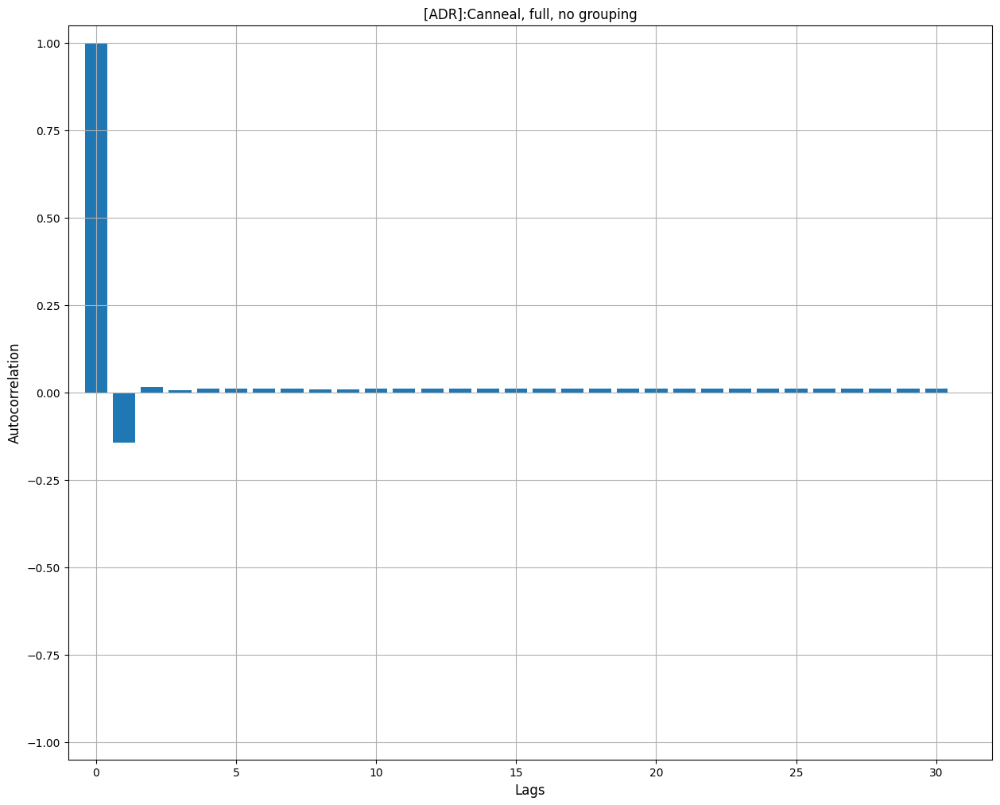

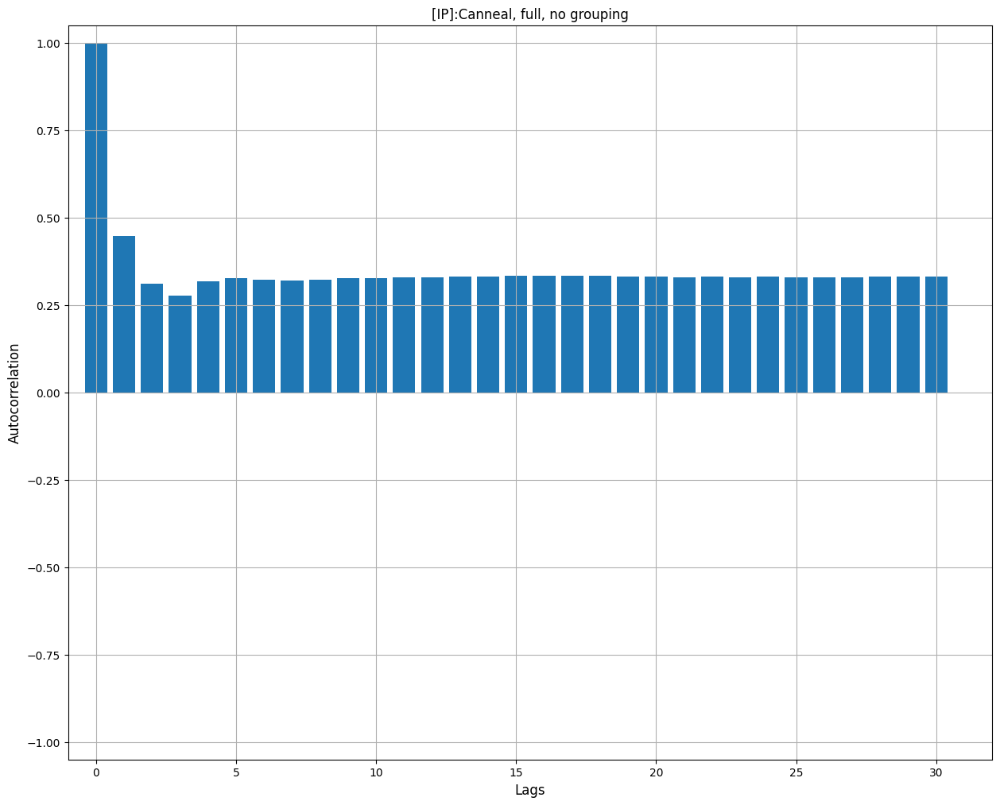

In [10]:
get_all_graphs(cfull,"Canneal, full, no grouping")

Main period detected at lag: 3
Main period detected at lag: 4


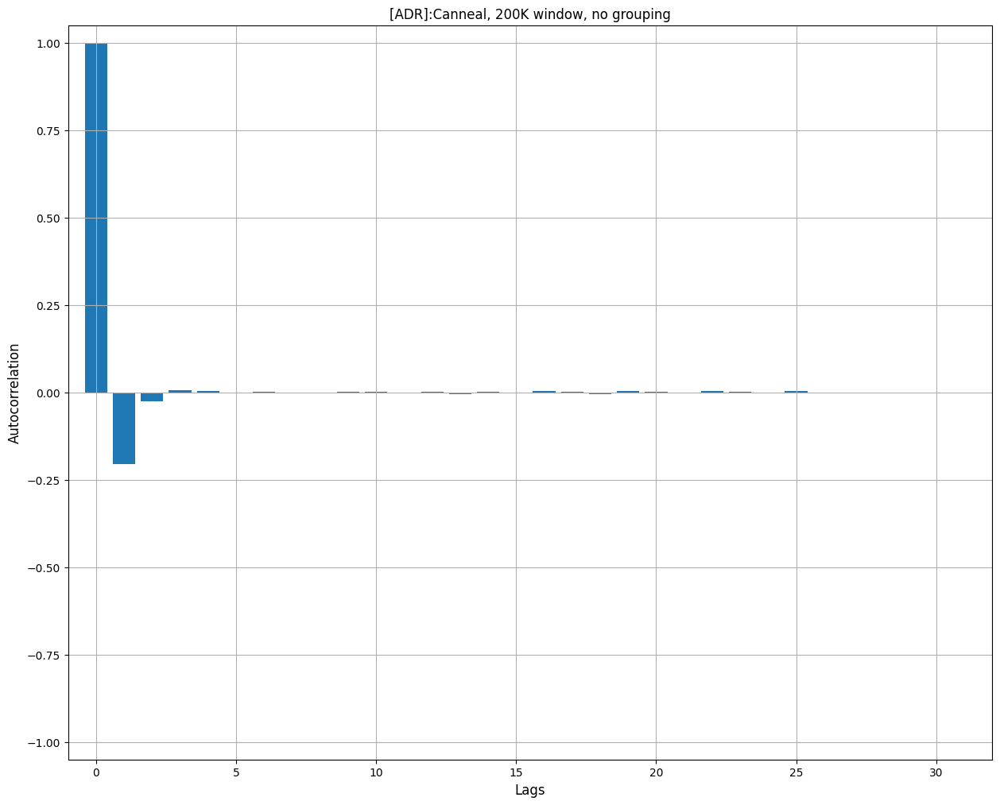

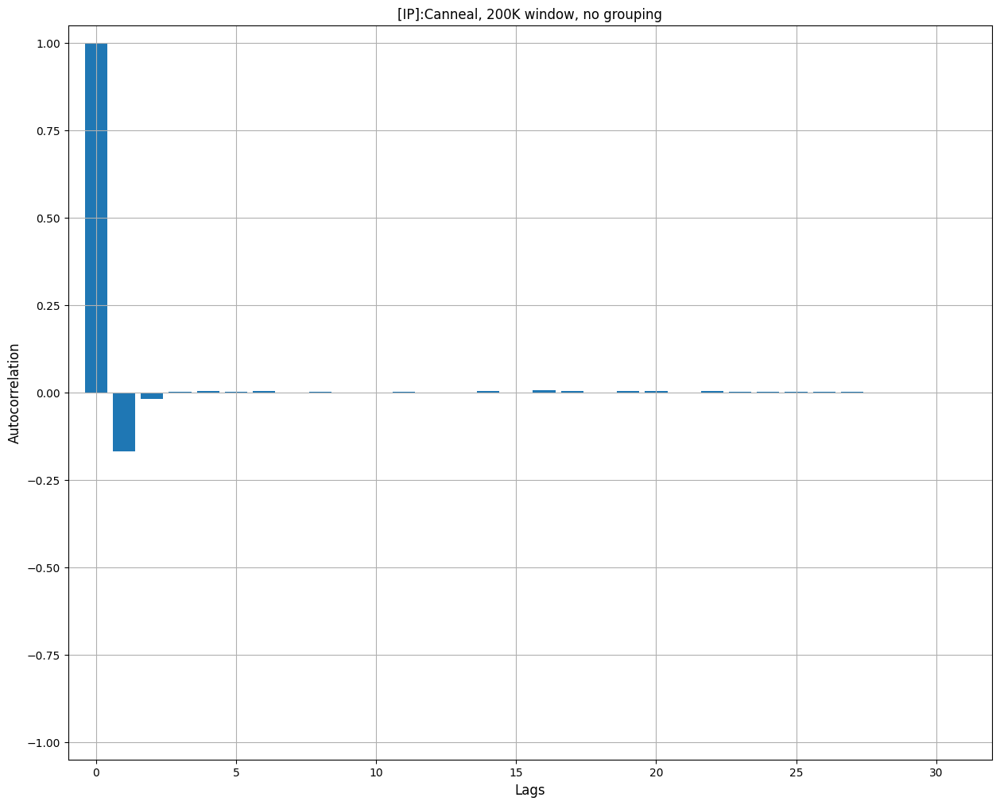

In [11]:
get_all_graphs(canneal_preprocessed,"Canneal, 200K window, no grouping")

In [12]:
FLUIDANIMATE_PATH = "/home/garvalov/mlp2/data/data/no_aslr_parsec_raw_out/fluidanimate/500_125/fltrace-data-faults-74002-1.out"
FLUIDANIMATE_PROCMAP = "/home/garvalov/mlp2/data/data/no_aslr_parsec_raw_out/fluidanimate/500_125/fltrace-data-procmaps-74002.out"
fl_runid = RunIdentifier("fluidanimate",500,125,74002)

In [13]:
fl_base_df = pd.read_csv(FLUIDANIMATE_PATH) 
fl_full,_ = single_preprocess(fl_runid,fl_base_df,FLUIDANIMATE_PROCMAP)

Translating iphex to int:   0%|          | 0/365736 [00:00<?, ?it/s]

Splitting and translating st:   0%|          | 0/365736 [00:00<?, ?it/s]

Inspect! fluidanimate_500_125_74002: # of weird ips is 2
Splitting stacktraces (can take several minutes)


Finding all ip librairies..: 100%|██████████| 284/284 [00:00<00:00, 199762.26it/s]


Removing all ips before fltrace:   0%|          | 0/365581 [00:00<?, ?it/s]

Translating addrhex to int:   0%|          | 0/365581 [00:00<?, ?it/s]

Main period detected at lag: 2
Main period detected at lag: 7


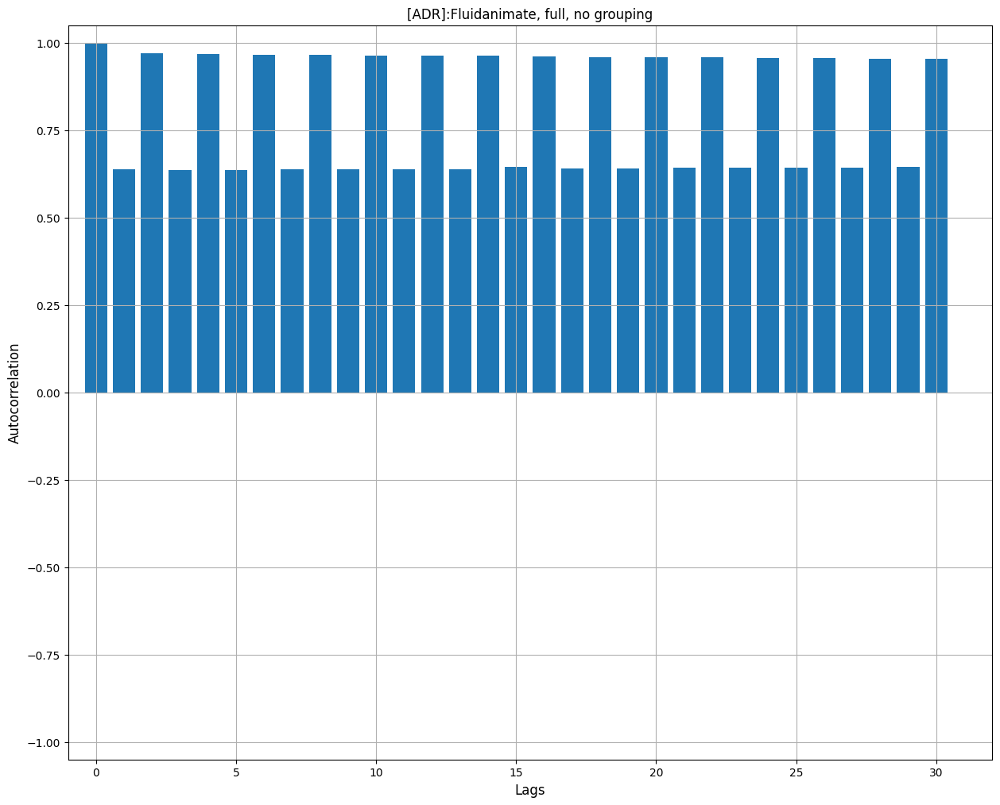

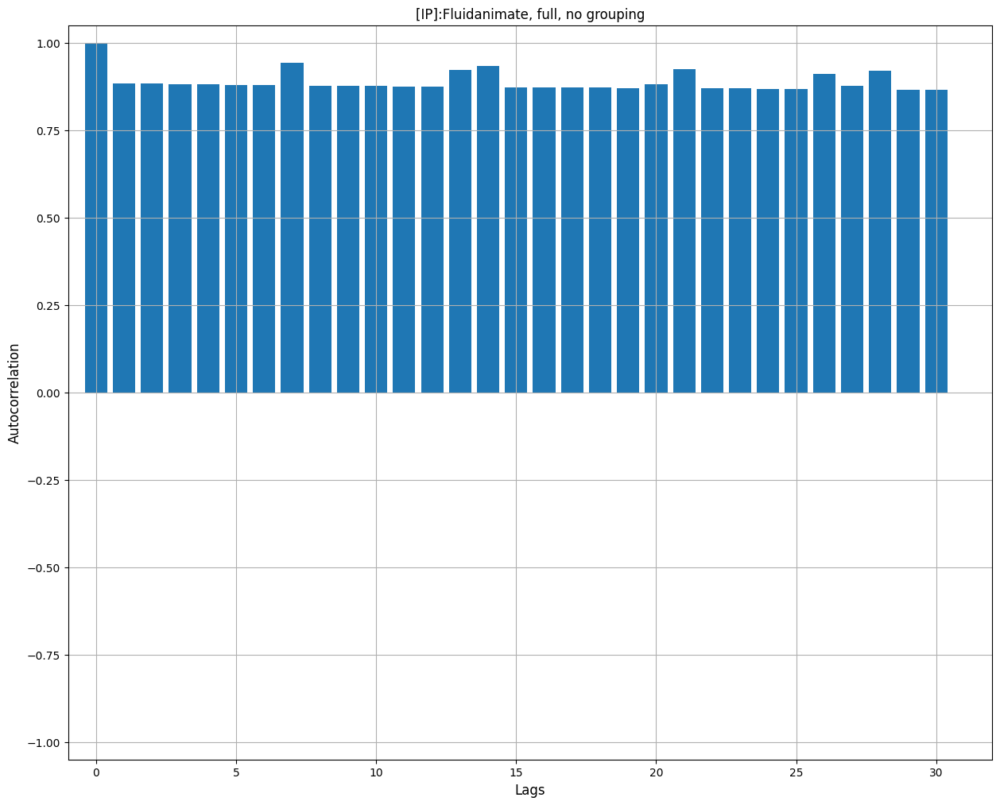

In [14]:
get_all_graphs(fl_full,"Fluidanimate, full, no grouping")

---

# Grouping

In [ ]:
def get_grouped_fig(grouped,cols:dict,bench_name):
    cols_fax = {}
    for col in cols.keys():
        f = plt.figure(figsize=(30,100))
        f.suptitle(f"{bench_name}, full, grouped")
        cols_fax[col] = f,f.subplots(len(grouped)//6+1,6) 
    for i,group in enumerate(sorted(grouped,key=lambda g: len(g[-1]),reverse=True)):
        gid,df = group
        df["d_tst"] = df["reltst"].diff()
        for col,col_name in cols.items():
            ax = cols_fax[col][-1][i//6,i%6]
            get_all_graphs(df,f"|g_{i}|={len(df)}",nlags=None,ax=ax,cols={col:col_name})
    for fax in cols_fax.values():
        fax[0].tight_layout()
        fax[0].show()
        fax[0].tight_layout() 
    

In [16]:
cfull.head()

,tstamp,ip,addr,flags,regs,stacktrace
2,1.729475e+09,140737290833824,140736597082112,33,140736597068160!140737349788404!1!0!1!14073659...,"(140737290833824, 140737294018874, 14073735391..."
3,1.729475e+09,140737290833824,140736597086208,33,140736597068160!140737349788404!2!0!0!14073659...,"(140737290833824, 140737294018874, 14073735391..."
4,1.729475e+09,140737290833824,140736597090304,33,140736597068160!140737349788404!3!0!0!14073659...,"(140737290833824, 140737294018874, 14073735391..."
8,1.729475e+09,140737289745921,140736597106688,33,140736597068160!140737349789684!14073659706592...,"(140737289745921, 140737294018874, 14073735391..."
13,1.729475e+09,140737294018886,140736599199744,33,0!140737295530232!140737488347648!140737488347...,"(140737294018886, 140737353913470, 14073735391..."


In [ ]:
def get_several_grouped(df,bench_name):
    dfc : pd.DataFrame = deepcopy(df)
    dfc = dfc.reset_index().rename(columns={'index':'reltst'})
    dfc["d_addr"] = dfc["addr"].diff()
    gp_cann = dfc.groupby(by="stacktrace")
    get_grouped_fig(gp_cann,cols={"addr":"ADR","d_addr":"$\Delta$ ADR","d_tst":"$\Delta$ TST"},bench_name=bench_name)


Main period detected at lag: 5
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 5
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 5
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 6
No peaks detected
Main period detected at lag: 5
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 2
Main peri

/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 5
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 5
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 5
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 4
No peaks detected
No peaks detected
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
No peaks detected

/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
No peaks detected
No peaks detected
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Main period detected at lag: 7
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 3
No peaks detected
No peaks detected
No peaks detected
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 5
No peaks detected
Main period detected at lag: 7
Main period detected at lag: 3
No peaks detected
No peaks detected
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 4
No peaks detected

/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
No peaks detected
No peaks detected
Main period detected at lag: 22
No peaks detected
No peaks detected
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
No peaks detected
Main period detected at lag: 4
No peaks detected
No peaks detected
Main period detected at lag: 5
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 2


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
Main period detected at lag: 2
Main period detected at lag: 7
No peaks detected
Main period detected at lag: 6
Main period detected at lag: 5
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 8
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
No peaks detected
Main period detected at lag: 3


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
No peaks detected
Main period detected at lag: 7
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 5
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 6
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 5
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 5
Main period detected at lag: 3
No peaks detected
No peaks detected
Main period detected at lag: 4


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
Main period detected at lag: 4
Main period detected at lag: 4
No peaks detected
No peaks detected
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 3
No peaks detected
No peaks detected
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 7
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 5
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 5
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 2
No peaks detected
No peaks detected
Main period detected at lag: 2
No peaks detected
No peaks detected
Main period detected at lag: 4


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
No peaks detected
Main period detected at lag: 2
No peaks detected
No peaks detected
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 4


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
No peaks detected
Main period detected at lag: 7
No peaks detected
No peaks detected
Main period detected at lag: 6
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 3
No peaks detected
No peaks detected
Main period detected at lag: 5
No peaks detected
Main period detected at lag: 4


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Main period detected at lag: 3
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 10
No peaks detected
No peaks detected
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 4
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
Main period detected at lag: 5
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 6
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 3
No peaks detected
No peaks detected
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 7
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 6
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 6
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 4
No peaks detected
Main period detected at lag: 5
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No p

/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
No peaks detected
Main period detected at lag: 3
No peaks detected
No peaks detected
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 3
No peaks detected
No peaks detected
Main period detected at lag: 2
No peaks detected
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Main period detected at lag: 2
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 4
Main period detected at lag: 2
No peaks detected
No peaks detected
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 2
No peaks detected
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 2


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
No peaks detected
No peaks detected
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 3
No peaks detected
No peaks detected
Main period detected at lag: 3
No peaks detected
No peaks detected
No peaks detected
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 2
Main period detected at lag: 2
No peaks detected
No peaks detected
Main period detected at lag: 3
No peaks detected
Main period detected at lag: 2
No peaks detected
No peaks detected
Main period detected at lag: 3
Main period detected at lag: 2
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
Main period detected at lag: 2
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
Main period detected at la

/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
Main period detected at lag: 2
No peaks detected
No peaks detected
Main period detected at lag: 2
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No

/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in 

No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/sklearn/utils/extmath.py:1142: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/sklearn/utils/extmath.py:1162: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/sklearn/utils/extmath.py:1137

No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/sklearn/utils/extmath.py:1142: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/sklearn/utils/extmath.py:1162: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:

No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected
No peaks detected


/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/sklearn/utils/extmath.py:1137: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/sklearn/utils/extmath.py:1142: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/sklearn/utils/extmath.py:1162: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count
/home/garvalov/mlp2/venv/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:

No peaks detected
No peaks detected
No peaks detected
No peaks detected


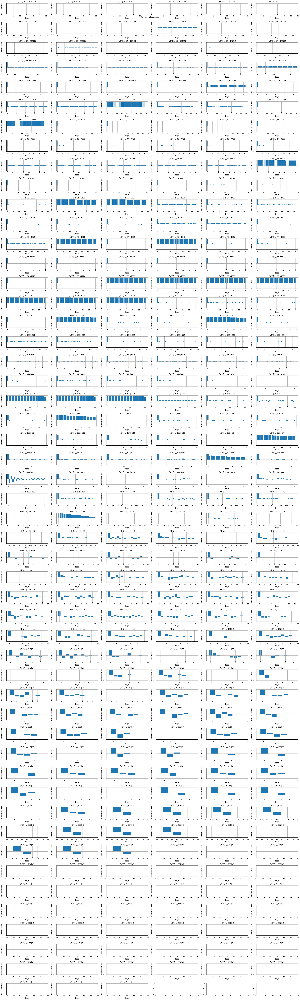

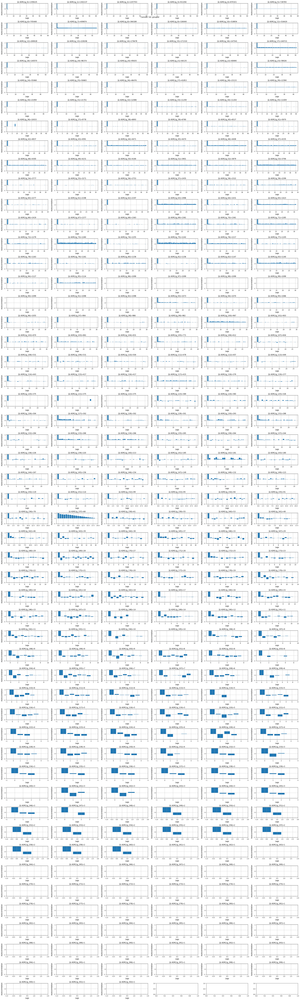

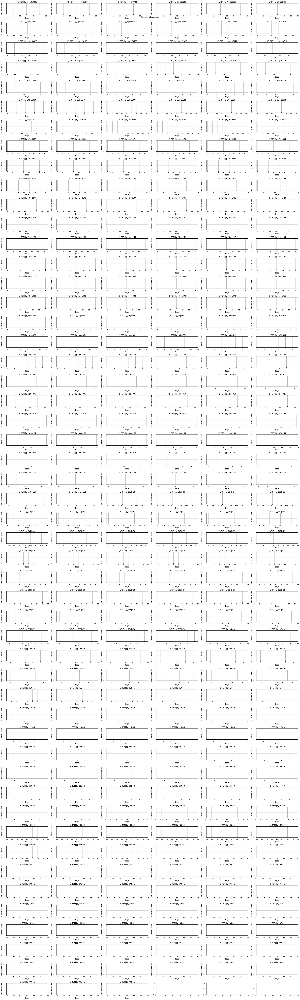

In [ ]:
get_several_grouped(cfull,"Canneal")

In [ ]:
get_several_grouped(fl_full,"fluidanimate")

TypeError: get_several_grouped() takes 1 positional argument but 2 were given

In [35]:
from plotters.plotter import *

In [67]:
def get_dtst_graphs(dfi):
    f = plt.figure(figsize=(40,40))
    dfc : pd.DataFrame = deepcopy(dfi)
    dfc = dfc.reset_index().rename(columns={'index':'reltst'})
    grouped = dfc.groupby(by="stacktrace")
    subfigs =  f.subfigures(len(grouped)//6+1,2*6)
    for i,group in enumerate(sorted(grouped,key=lambda g: len(g[-1]),reverse=True)):
        l_fig,r_fig = subfigs[i//6,2*(i%6)],subfigs[i//6,2*(i%6)+1]
        l_fig:plt.Figure = l_fig
        ax = l_fig.subplots() 
        gid,df = group
        df["d_tst"] = df["reltst"].diff()
        ax.plot(np.arange(len(df)),df.d_tst.values)
        vc = df.d_tst.value_counts()
        vc = 100*vc/vc.values.sum()
        r_fig.subplots().pie(vc)
        # get_pie_bar_zoom_in(vc.values,vc.index.values,already_existing_figure=r_fig)
        
    plt.ion()
    f.tight_layout()
    display(f)
    f.show()

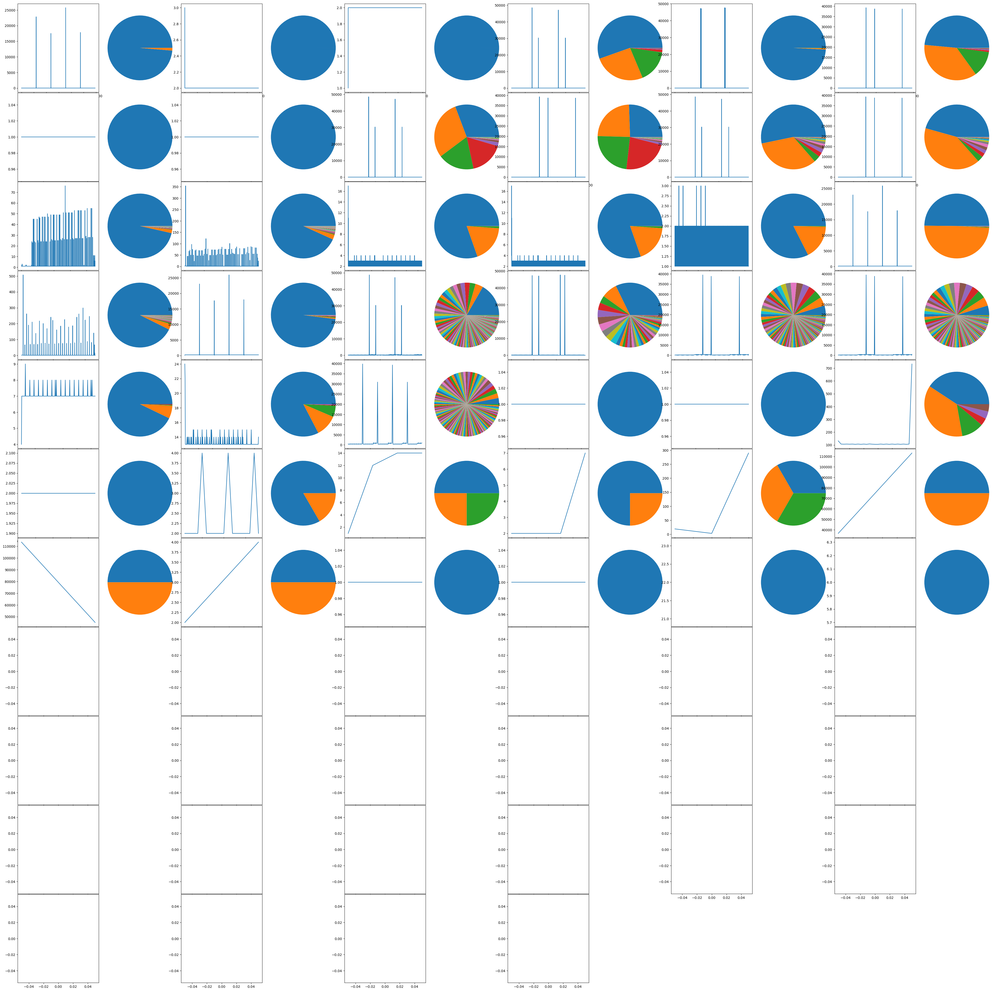

In [68]:
get_dtst_graphs(fl_full)

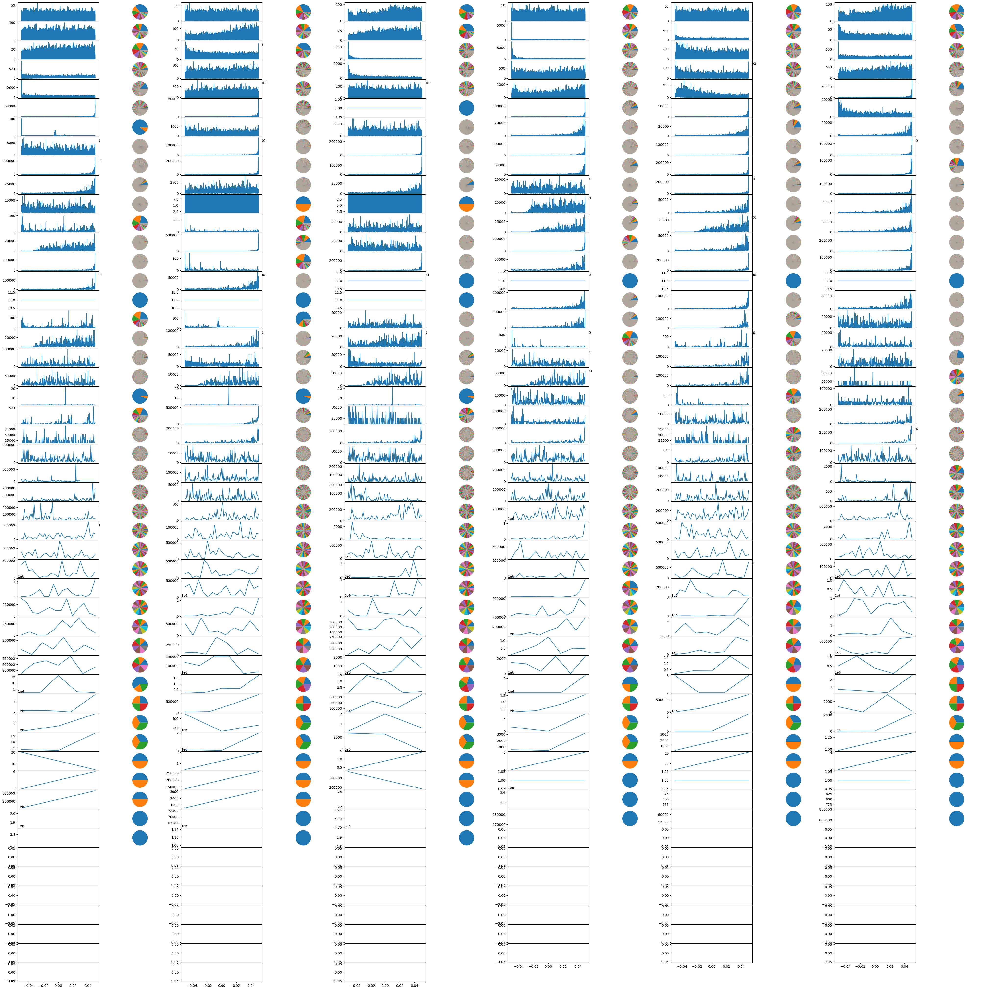

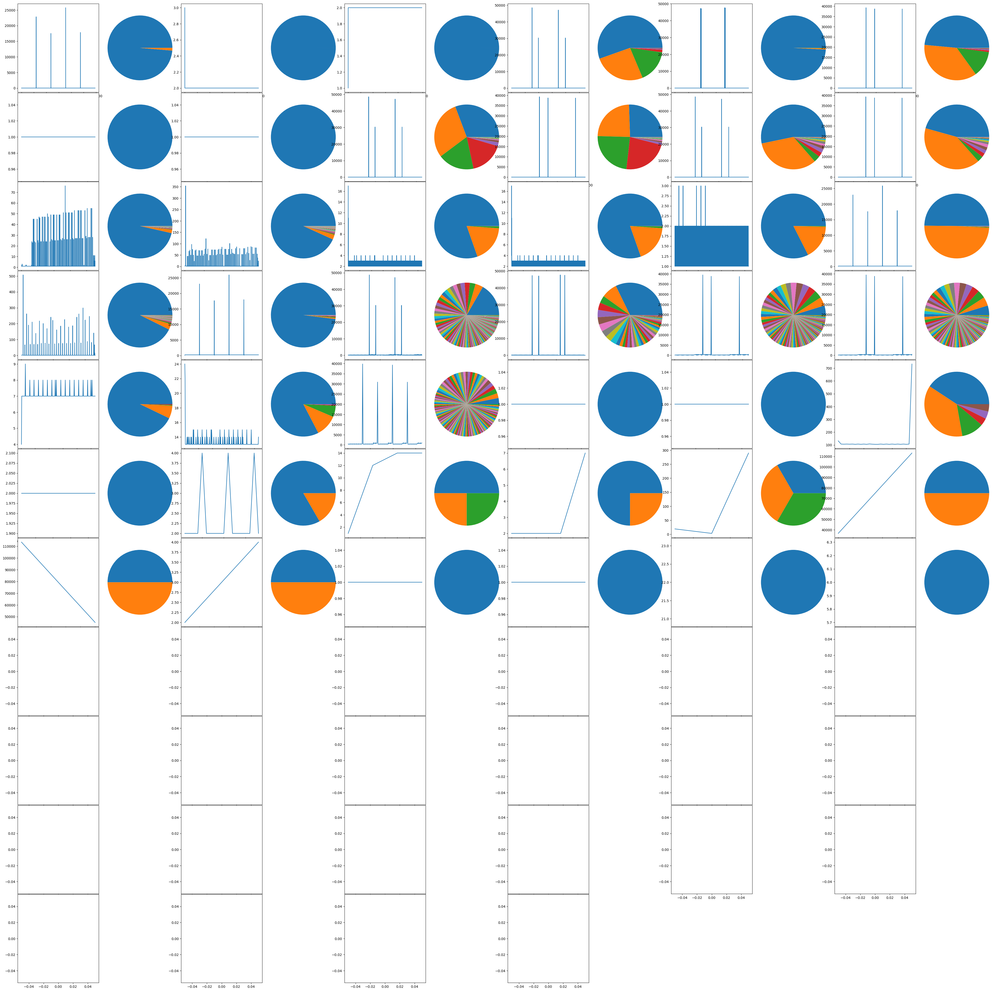

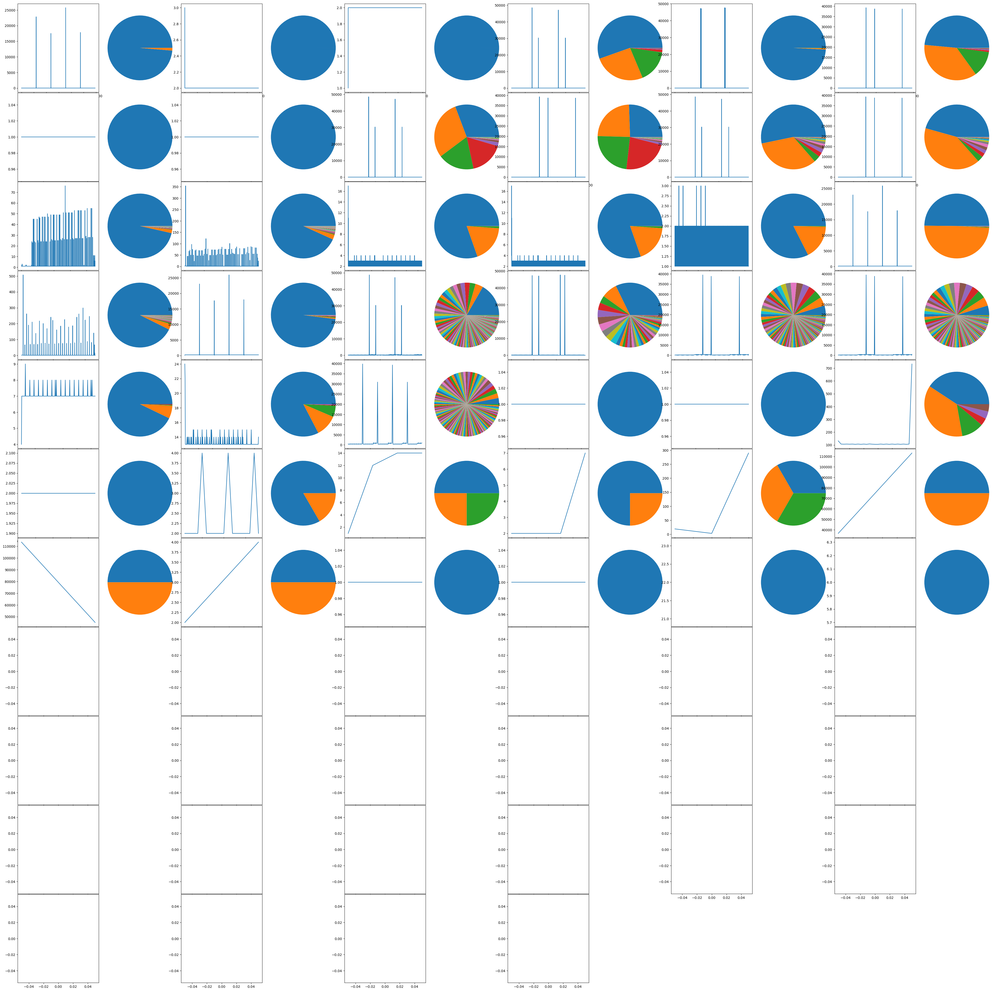

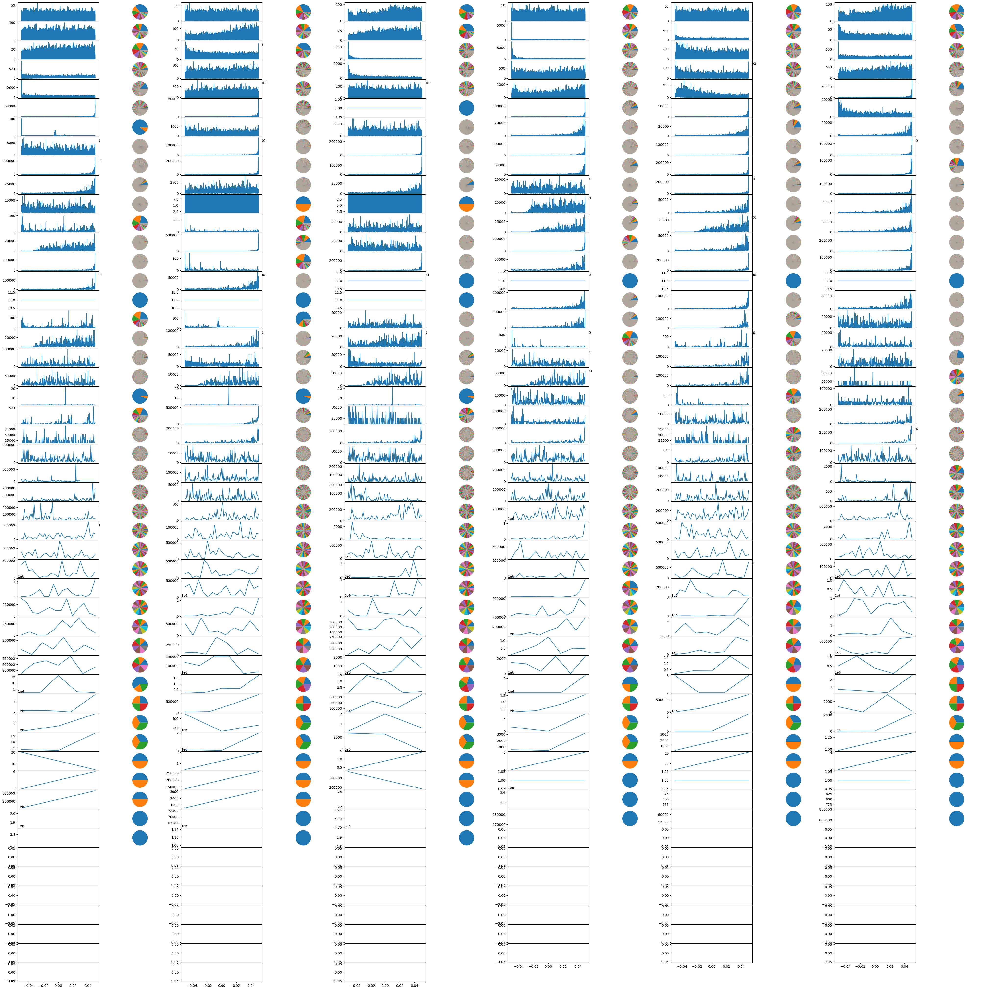

In [69]:
get_dtst_graphs(cfull)